In [58]:
import os


# Environment configuration for a clean Jupyter environment with minimal logs and GPU setup.
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"
os.environ["TF_CPP_MIN_VLOG_LEVEL"] = "3"
os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID"
os.environ["TF_ENABLE_ONEDNN_OPTS"] = "0"
os.environ["TF_TRT_ALLOW_ENGINE_NATIVE_SEGMENT_EXECUTION"] = "false"
os.environ["GRPC_VERBOSITY"] = "ERROR"
os.environ["GRPC_CPP_LOG_LEVEL"] = "ERROR"

# Set visible GPU devices before importing TensorFlow
USE_ONLY_GPU_INDEX = 0
from tensorflow.python.framework import config as tf_config

physical_devices = tf_config.list_physical_devices('GPU')
if physical_devices:
    try:
        tf_config.set_visible_devices(physical_devices[USE_ONLY_GPU_INDEX], 'GPU')
        tf_config.set_memory_growth(physical_devices[USE_ONLY_GPU_INDEX], True)
    except RuntimeError as e:
        print("GPU config error:", e)
else:
    raise RuntimeError("No GPU found!")

# Import TensorFlow and silence warnings
import tensorflow as tf
import warnings
warnings.filterwarnings('ignore')
tf.get_logger().setLevel('ERROR')

print("GPUs available:", tf.config.list_logical_devices('GPU'))


GPUs available: [LogicalDevice(name='/device:GPU:0', device_type='GPU')]


In [59]:
pip install backtesting

Looking in indexes: https://pypi.netflix.net/simple
Note: you may need to restart the kernel to use updated packages.


In [60]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from joblib import load, dump

from backtesting import Backtest, Strategy
from bokeh.io import show, output_notebook, save

from tensorflow.keras.models import Model, Sequential, load_model, save_model
from tensorflow.keras.layers import (Input, MultiHeadAttention, Dropout, LayerNormalization,
                                     GlobalAveragePooling1D, Dense, Conv1D, MaxPooling1D,
                                     Flatten, GRU, SimpleRNN)
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, CSVLogger

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score


## Data

In [61]:
def create_target_df(features_df, asset_label):
    # Create a new DataFrame with the same index as features_df (the date ID remains intact)
    target_df = pd.DataFrame(index=features_df.index)
    # Add the shifted 'Close' price for the asset
    target_df[f'{asset_label}_Close_1m_later'] = features_df['Close'].shift(-1)
    # Drop any rows where the shifted value is NaN (e.g., the last row)
    target_df.dropna(inplace=True)
    return target_df


In [62]:
PROCESSED_DATA = os.path.join("data", "processed-data")
btc_features_file = os.path.join(PROCESSED_DATA, "btc_1min_with_features.csv.gz")
btc_df_features = pd.read_csv(btc_features_file, compression="gzip")

In [63]:
btc_targets = create_target_df(btc_df_features, 'btc')

In [64]:
eth_features_file = os.path.join(PROCESSED_DATA, "eth_1min_with_features.csv.gz")
eth_df_features = pd.read_csv(eth_features_file, compression="gzip")

In [65]:
eth_targets = create_target_df(eth_df_features, 'eth')

## Constants & Functions

In [66]:
# File paths for saving results
RESULT_DATA_DIR = os.path.join("data", "result-data")
os.makedirs(RESULT_DATA_DIR, exist_ok=True)

In [67]:
# %%
# Utility: Create directories
def setup_directories():
    os.makedirs("plots", exist_ok=True)
    os.makedirs("models", exist_ok=True)
    os.makedirs("logs", exist_ok=True)
    return "Done"

# %%
# Prepares merged dataset of features + targets and subsets by percentage
def get_data_subset(features_df, targets_df, target_col, data_percent=0.01):
    common_index = features_df.index.intersection(targets_df.index).sort_values()
    subset_size = int(len(common_index) * data_percent)
    subset_dates = common_index[:subset_size]
    print("Total data values:", len(common_index))
    print("Data being used:", subset_size)
    if len(subset_dates) > 0:
        print("Start ID:", subset_dates[0])
        print("End ID:", subset_dates[-1])
    X = features_df.loc[subset_dates].copy()
    y = targets_df.loc[subset_dates, target_col].copy()
    subset = X.copy()
    subset[target_col] = y
    return X, y, subset

# %%
# Normalize features using MinMaxScaler
def scale_features(X):
    
    scaler = MinMaxScaler()
    X_scaled = scaler.fit_transform(X)
    return X_scaled, scaler

# %%
# Convert time-series data into sequences
def create_sequences(X, y, time_steps=30):
    """
    Returns:
      - Xs: [n_samples, time_steps, n_features]
      - ys: [n_samples,]
      - indices: the row index in the original DataFrame that corresponds
                 to each label in `ys`.
    """
    Xs, ys = [], []
    indices = []  # will store i+time_steps for labeling
    for i in range(len(X) - time_steps):
        Xs.append(X[i : i + time_steps])
        ys.append(y[i + time_steps])
        indices.append(i + time_steps)
    return np.array(Xs), np.array(ys), np.array(indices)

# %%
# Time-based train/test split
def train_test_split_sequences(X_seq, y_seq, indices, train_ratio=0.8):
    train_size = int(len(X_seq) * train_ratio)

    X_train = X_seq[:train_size]
    y_train = y_seq[:train_size]
    idx_train = indices[:train_size]

    X_test  = X_seq[train_size:]
    y_test  = y_seq[train_size:]
    idx_test = indices[train_size:]

    return X_train, y_train, X_test, y_test, idx_train, idx_test

# %%
# Build GRU model (easily replaceable with CNN/Transformer later)
def build_gru_model(input_shape):
    model = Sequential()
    model.add(GRU(64, activation='tanh', input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation='linear'))
    model.compile(loss='mse', optimizer=Adam(learning_rate=0.001))
    return model

def format_percent_string(p):
    return f"{p * 100:.4f}".rstrip("0").rstrip(".").replace(".", "_")


# %%
# Train model with checkpointing and logging
def train_model(model, X_train, y_train, X_val, y_val, data_percent=0.01, epochs=20, model_name="model", asset="btc"):
    
    percent_display = format_percent_string(data_percent)
    model_prefix = f"{model_name}_{asset.lower()}"
    
    model_filename = f"{model_prefix}_model_{percent_display}pct.h5"
    log_filename = f"{model_prefix}_log_{percent_display}pct.csv"

    checkpoint = ModelCheckpoint(os.path.join("models", model_filename), monitor="val_loss", save_best_only=True, verbose=1)
    early_stop = EarlyStopping(monitor="val_loss", patience=5, restore_best_weights=True, verbose=1)
    csv_logger = CSVLogger(os.path.join("logs", log_filename))

    history = model.fit(
        X_train, y_train,
        epochs=epochs,
        batch_size=32,
        validation_data=(X_val, y_val),
        callbacks=[checkpoint, early_stop, csv_logger],
        verbose=1
    )
    return history


# %%
# Evaluate performance
def print_metrics(y_test, y_pred, data_percent=0.01):
    
    # 1) Build actual returns/deltas
    actual_return = np.diff(y_test.reshape(-1))  # shape => (len(y_test)-1,)
    # 2) Build predicted returns/deltas
    predicted_return = np.diff(y_pred.reshape(-1))

    # 3) Convert returns to signals: up (1), down (-1)
    test_signal = np.where(actual_return > 0, 1, -1)
    pred_signal = np.where(predicted_return > 0, 1, -1)

    # 4) Now compute metrics
    acc = accuracy_score(test_signal, pred_signal)
    prec = precision_score(test_signal, pred_signal, pos_label=1)
    rec = recall_score(test_signal, pred_signal, pos_label=1)
    f1 = f1_score(test_signal, pred_signal, pos_label=1)

    print(f"Accuracy:  {acc:.4f}")
    print(f"Precision: {prec:.4f}")
    print(f"Recall:    {rec:.4f}")
    print(f"F1-Score:  {f1:.4f}")
    
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test, y_pred)

    print(f"Metrics for {data_percent*100:.3f}% dataset:")
    print(f"MSE:  {mse:.4f}")
    print(f"RMSE: {rmse:.4f}")
    print(f"MAE:  {mae:.4f}")


In [68]:
def plot_loss(history, plots_dir="plots", data_percent=0.01, model_name="gru", dataset_name="btc"):


    # Ensure directory exists
    os.makedirs(plots_dir, exist_ok=True)

    # Format percent strings
    percent_display_filename = format_percent_string(data_percent)  # for file name
    percent_display_title = f"{data_percent * 100:.2f}"            # for title

    # Plot
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Val Loss')
    plt.title(f"Loss Curve ({percent_display_title}% Data)")
    plt.xlabel("Epoch")
    plt.ylabel("MSE")
    plt.legend()
    plt.grid(True)

    # Save to file inside plots directory
    filename = f"loss_curve_{model_name}_{dataset_name}_{percent_display_filename}pct.png"
    loss_curve_path = os.path.join(plots_dir, filename)
    plt.savefig(loss_curve_path)
    plt.show()
    print(f"Loss curve saved to: {loss_curve_path}")


In [69]:
def plot_predictions(y_test, y_pred, plots_dir="plots", data_percent=0.01, model_name="gru", dataset_name="btc", last_n=200):


    # Ensure plots directory exists
    os.makedirs(plots_dir, exist_ok=True)

    # Format percent strings
    percent_display_filename = format_percent_string(data_percent)  # for file name
    percent_display_title = f"{data_percent * 100:.2f}"            # for plot title

    # Build comparison DataFrame
    comparison_df = pd.DataFrame({
        "Actual": y_test,
        "Predicted": y_pred.flatten()
    })

    # Plot predictions
    plt.figure(figsize=(10, 4))
    plt.plot(comparison_df["Actual"][-last_n:], label="Actual")
    plt.plot(comparison_df["Predicted"][-last_n:], label="Predicted", linestyle="--")
    plt.title(f"{dataset_name.upper()} Close Price Prediction (Last {last_n} Samples) - {percent_display_title}% Data")
    plt.xlabel("Time Step")
    plt.ylabel("Close Price")
    plt.legend()
    plt.grid(True)

    # Save plot
    filename = f"prediction_plot_{model_name}_{dataset_name}_{percent_display_filename}pct.png"
    plot_path = os.path.join(plots_dir, filename)
    plt.savefig(plot_path)
    print(f"Prediction plot saved to: {plot_path}")
    plt.show()

    # Save DataFrame comparison to CSV
    result_file = os.path.join(RESULT_DATA_DIR, f"{model_name}_{dataset_name}_comparison_{percent_display_filename}pct.csv")

    comparison_df.to_csv(result_file, index=False)

    print(f"Comparison CSV saved to: {result_file}")
    return comparison_df


In [70]:
def save_model_and_scaler(model, scaler, model_name: str, dataset_name: str, data_percent: float, model_ext: str = "h5"):
    os.makedirs("models", exist_ok=True)

    # Format percent with up to 4 decimal places, replace dot with underscore
    percent_str = f"{data_percent * 100:.4f}".rstrip("0").rstrip(".").replace(".", "_")

    model_filename = f"{model_name}_{dataset_name}_model_{percent_str}pct.{model_ext}"
    scaler_filename = f"{model_name}_{dataset_name}_scaler_{percent_str}pct.pkl"

    model_path = Path("models") / model_filename
    scaler_path = Path("models") / scaler_filename

    if model_ext in ['h5', 'keras']:
        save_model(model, str(model_path))
    else:
        dump(model, model_path)

    dump(scaler, scaler_path)

    print("Model saved to:", model_path.resolve().relative_to(Path.cwd()))
    print("Scaler saved to:", scaler_path.resolve().relative_to(Path.cwd()))


In [71]:
def load_model_and_scaler(model_name: str, dataset_name: str, data_percent: float, model_ext: str = "h5"):
    # Format percent with full decimals and replace '.' with '_'
    percent_str = f"{data_percent * 100:.4f}".rstrip("0").rstrip(".").replace(".", "_")

    model_filename = f"{model_name}_{dataset_name}_model_{percent_str}pct.{model_ext}"
    scaler_filename = f"scaler_{dataset_name}_{percent_str}pct.pkl"

    model_path = Path("models") / model_filename
    scaler_path = Path("models") / scaler_filename

    if model_ext in ['h5', 'keras']:
        model = load_model(model_path)
    else:
        model = load(model_path)

    scaler = load(scaler_path)

    print("Model loaded from:", model_path.resolve().relative_to(Path.cwd()))
    print("Scaler loaded from:", scaler_path.resolve().relative_to(Path.cwd()))

    return model, scaler

In [72]:
from bokeh.io import save, reset_output

def run_backtest(
    df_bt,
    initial_cash=10_000,
    model_name="gru",
    dataset_name="btc",
    data_percent=0.01,
    stop_loss_pct=0.0  # default: no stop loss
):
    print("Setting up Backtest object...")
    bt = Backtest(
        df_bt,
        MLStrategy,
        cash=initial_cash,
        commission=0.0,
        exclusive_orders=True
    )
    
    print("Running backtest engine...")
    stats = bt.run(stop_loss_pct=stop_loss_pct)
    print(stats)
    
    trades_df = getattr(stats, 'trades', None) or getattr(stats, '_trades', None)
    if trades_df is not None:
        n_trades = len(trades_df)
        n_closed_trades = trades_df['ExitPrice'].notna().sum()
        n_open_trades = trades_df['ExitPrice'].isna().sum()
        
        print("\nTrade Details:")
        print(f"Number of trades:       {n_trades}")
        print(f"Number of closed trades:{n_closed_trades}")
        print(f"Number of open trades:  {n_open_trades}")
    
    print("Saving backtest plot to HTML...")
    from bokeh.io import save
    import os
    
    # Format stop loss as percentage string for filenames
    stop_str = f"sl{int(stop_loss_pct * 10000):04d}"  # e.g. 0.025 becomes 'sl0025'
    result_dir = os.path.join(
        "results",
        f"{model_name}_{dataset_name}_{data_percent*100:.2f}pct_{stop_str}"
    )
    os.makedirs(result_dir, exist_ok=True)
    #have to save this outside, as this was making the notebook crash
    html_filename = os.path.join(result_dir, "backtest_plot.html")
    save_interactive_chart(bt, html_filename)
    csv_filename = os.path.join(result_dir, "backtest_stats.csv")
    stats.to_csv(csv_filename)
    print("Backtest stats saved to:", csv_filename)

    
    
    return stats

In [73]:
from backtesting import Strategy

class MLStrategy(Strategy):
    """
    MLStrategy that:
      1) Skips all signals until the *first* bar with Signal == +1, then opens a long.
      2) After that first entry, on every bar:
         - If Signal == +1 => be (or stay) long.
         - If Signal == -1 => be (or stay) short.
      3) Optionally applies a stop loss if stop_loss_pct > 0.
      4) Closes any open position in the stop() method.
    """
    stop_loss_pct = 0.0

    def init(self):
        # Read the signal series from the data
        self.signal = self.data.Signal
        
        # Print how many +1 and -1 signals we have in the entire dataset
        num_pos_signals = int((self.signal == 1).sum())
        num_neg_signals = int((self.signal == -1).sum())
        print(f"Found {num_pos_signals} +1 signals and {num_neg_signals} -1 signals in the data.")
        
        # Track whether we have opened the *first* trade yet
        self.opened_first_time = False

    def next(self):
        # Get the current bar's index and use it to fetch the full data (OHLC and Signal) from the original DataFrame.
        current_idx = self.data.index[-1]
        current_close = self.data.df.loc[current_idx, 'Close']
        current_signal = self.data.df.loc[current_idx, 'Signal']
    
        # Compute the current trade's profit using our own stored entry price if available.
        # For a long, profit = current_close - entry; for a short, profit = entry - current_close.
        current_profit = 0.0
        if self.position and hasattr(self, 'my_entry_price'):
            if self.position.is_long:
                current_profit = current_close - self.my_entry_price
            elif self.position.is_short:
                current_profit = self.my_entry_price - current_close
    
        # 1) For the first trade: only enter when the signal is +1.
        if not self.opened_first_time:
            if current_signal == 1:
                self.opened_first_time = True
                if self.stop_loss_pct > 0:
                    stop_loss_price = current_close * (1 - self.stop_loss_pct)
                    self.buy(sl=stop_loss_price)
                else:
                    self.buy()
                # Record our entry price for subsequent profit calculations.
                self.my_entry_price = current_close
            return  # Exit early until first trade is taken.
    
        # 2) For subsequent bars, adjust positions based on the signal.
        if current_signal == 1:
            # If not currently long, flip to long (close any short and go long).
            if not self.position.is_long:
                self.position.close()
                if self.stop_loss_pct > 0:
                    stop_loss_price = current_close * (1 - self.stop_loss_pct)
                    self.buy(sl=stop_loss_price)
                else:
                    self.buy()
                # Update the entry price after the trade is executed.
                self.my_entry_price = current_close
    
        elif current_signal == -1:
            # Only reverse to short if there's an open long position that is already in profit.
            if self.position and self.position.is_long and current_profit > 0:
                self.position.close()
                if self.stop_loss_pct > 0:
                    stop_loss_price = current_close * (1 + self.stop_loss_pct)
                    self.sell(sl=stop_loss_price)
                else:
                    self.sell()
                # Update the entry price for the new short position.
                self.my_entry_price = current_close



    def stop(self):
        # Force-close any open position at the end of the backtest
        self.position.close()


## Initial Testing - Model Pipeline

Some of the functions differ from the initial testing, as they were updated.

In [13]:
# Variables for initial testing

DATA_PERCENT = 0.001
TIME_STEPS = 30
TARGET_COL = "btc_Close_1m_later"


In [5]:
setup_directories()

'Done'

In [8]:
X_raw, y_raw, btc_subset = get_data_subset(btc_df_features, btc_targets, TARGET_COL, DATA_PERCENT)


In [9]:
X_scaled, scaler = scale_features(X_raw)


In [10]:
X_seq, y_seq = create_sequences(X_scaled, y_raw.values, TIME_STEPS)

In [11]:
X_train, y_train, X_test, y_test = train_test_split_sequences(X_seq, y_seq)

In [12]:
model = build_gru_model(input_shape=(X_train.shape[1], X_train.shape[2]))

In [13]:
history = train_model(model, X_train, y_train, X_test, y_test, DATA_PERCENT)

Epoch 1/20
151/157 [===========================>..] - ETA: 0s - loss: 1.2512   
Epoch 1: val_loss improved from inf to 0.01225, saving model to models/gru_btc_model_0_1pct.h5
157/157 [==============================] - 4s 7ms/step - loss: 1.2152 - val_loss: 0.0123
Epoch 2/20
153/157 [============================>.] - ETA: 0s - loss: 0.1710
Epoch 2: val_loss improved from 0.01225 to 0.01056, saving model to models/gru_btc_model_0_1pct.h5
157/157 [==============================] - 1s 4ms/step - loss: 0.1703 - val_loss: 0.0106
Epoch 3/20
152/157 [============================>.] - ETA: 0s - loss: 0.1527
Epoch 3: val_loss improved from 0.01056 to 0.00613, saving model to models/gru_btc_model_0_1pct.h5
157/157 [==============================] - 1s 4ms/step - loss: 0.1516 - val_loss: 0.0061
Epoch 4/20
151/157 [===========================>..] - ETA: 0s - loss: 0.1406
Epoch 4: val_loss improved from 0.00613 to 0.00585, saving model to models/gru_btc_model_0_1pct.h5
157/157 [=====================

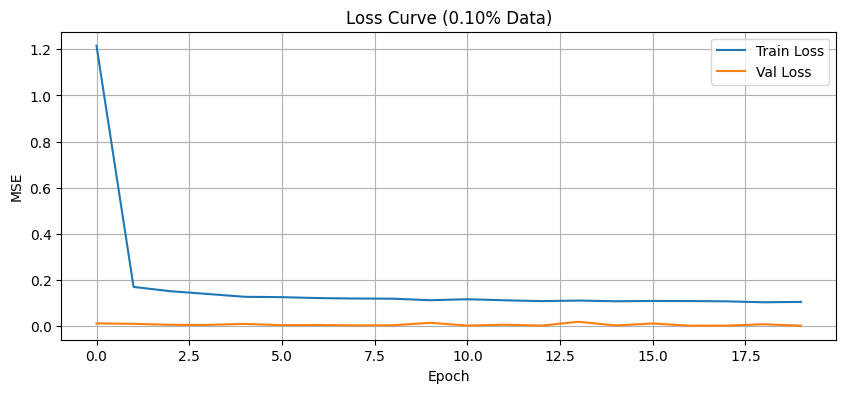

Loss curve saved to: plots/loss_curve_gru_btc_0_1pct.png


In [15]:
plot_loss(history, data_percent=DATA_PERCENT, model_name="gru", dataset_name="btc")

In [16]:
y_pred = model.predict(X_test)

40/40 [==============================] - 0s 1ms/step


Prediction plot saved to: plots/prediction_plot_gru_btc_0_1pct.png


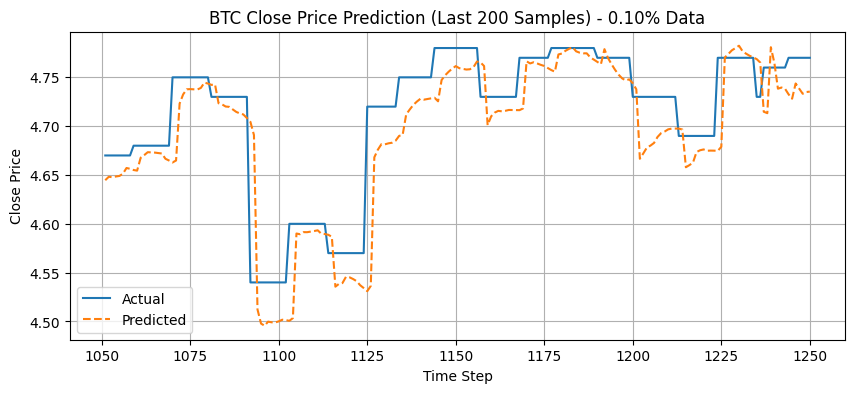

Comparison CSV saved to: data/result-data/btc_comparison_0_1pct.csv


In [18]:


comparison_df = plot_predictions(y_test, y_pred, data_percent=DATA_PERCENT, model_name="gru", dataset_name="btc")


In [19]:
print_metrics(y_test, y_pred, DATA_PERCENT)

Metrics for 0.100% dataset:
MSE:  0.0023
RMSE: 0.0475
MAE:  0.0286


In [21]:
save_model_and_scaler(model, scaler, model_name="gru", dataset_name="btc", data_percent=DATA_PERCENT)

Model saved to: models/gru_btc_model_0_1pct.h5
Scaler saved to: models/scaler_btc_0_1pct.pkl


In [23]:
model, scaler = load_model_and_scaler(model_name="gru", dataset_name="btc", data_percent=DATA_PERCENT)

Model loaded from: models/gru_btc_model_0_1pct.h5
Scaler loaded from: models/scaler_btc_0_1pct.pkl


In [35]:

# Example usage:
stats = run_backtest(y_test, y_pred, initial_cash=100, model_name="gru", dataset_name="btc", data_percent=DATA_PERCENT)


Loading BokehJS ...

Backtest.run:   0%|          | 0/1250 [00:00<?, ?bar/s]

Start                     2022-01-01 00:00:00
End                       2022-01-01 20:50:00
Duration                      0 days 20:50:00
Exposure Time [%]                         0.0
Equity Final [$]                       110.98
Equity Peak [$]                        115.12
Return [%]                              10.98
Buy & Hold Return [%]               -11.33829
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]                     NaN
CAGR [%]                  1058035078373143...
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              0.0
Alpha [%]                              1.7785
Beta                                 -0.81154
Max. Drawdown [%]                     -5.9166
Avg. Drawdown [%]                    -2.58323
Max. Drawdown Duration        0 days 02:28:00
Avg. Drawdown Duration        0 days 00:49:00
# Trades                                    0
Win Rate [%]                      

## Testing - Backtesting

In [12]:
asset="btc" 
model_function=build_gru_model
model_name="gru"
data_percent= 0.1
initial_cash=100_000 
epochs=2
time_steps = 30
targets_df = btc_targets
features_df= btc_df_features

Loading data for asset: btc
Subsetting data...
Data subset shape: (628346, 45), (628346,)
Extracting OHLC columns...
Normalizing features...
Creating sequences...
Total sequences: 628316
Splitting data into training and testing sets...
Train size: (502652, 30, 41), Test size: (125664, 30, 41)
Building model...
Training model...
Epoch 1/2
15696/15708 [============================>.] - ETA: 0s - loss: 749.3784      
Epoch 1: val_loss improved from inf to 428298.65625, saving model to models/gru_btc_model_10pct.h5
15708/15708 [==============================] - 52s 3ms/step - loss: 748.8467 - val_loss: 428298.6562
Epoch 2/2
15705/15708 [============================>.] - ETA: 0s - loss: 42.6639  
Epoch 2: val_loss improved from 428298.65625 to 398389.37500, saving model to models/gru_btc_model_10pct.h5
15708/15708 [==============================] - 48s 3ms/step - loss: 42.6638 - val_loss: 398389.3750
Plotting training loss...


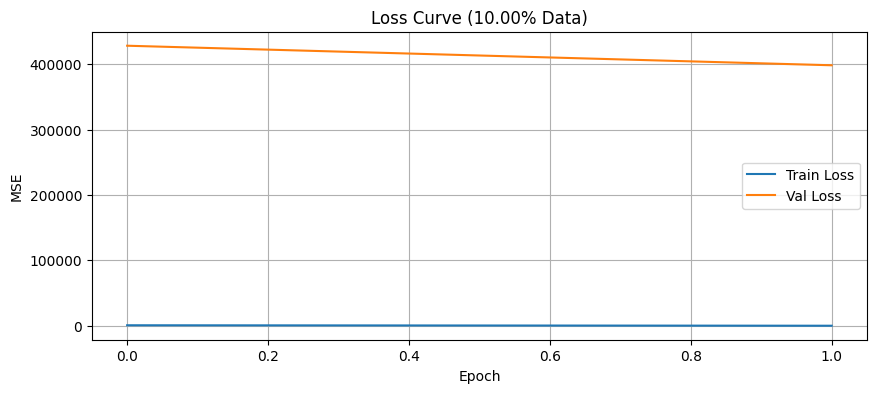

Loss curve saved to: plots/loss_curve_gru_btc_10pct.png
Generating predictions...
3927/3927 [==============================] - 5s 1ms/step
Predictions shape: (125664, 1)
Plotting predictions and saving comparison CSV...
Prediction plot saved to: plots/prediction_plot_gru_btc_10pct.png


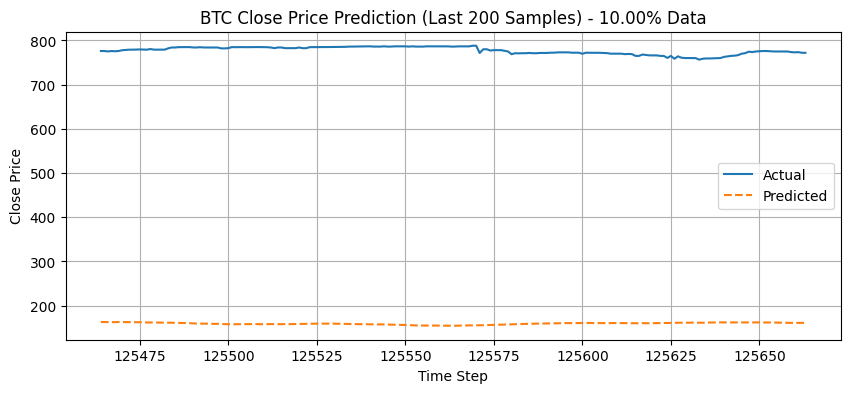

Comparison CSV saved to: data/result-data/btc_comparison_gru_10pct.csv
Printing evaluation metrics...
Accuracy:  0.5037
Precision: 0.3470
Recall:    0.5006
F1-Score:  0.4099
Metrics for 10.000% dataset:
MSE:  398390.1232
RMSE: 631.1815
MAE:  596.4324
Saving model and scaler...
Model saved to: models/gru_btc_model_10pct.h5
Scaler saved to: models/scaler_btc_10pct.pkl


In [13]:
print(f"Loading data for asset: {asset}")
target_col = "btc_Close_1m_later"

print("Subsetting data...")
X_raw, y_raw, merged_subset = get_data_subset(features_df, targets_df, target_col, data_percent)
print(f"Data subset shape: {X_raw.shape}, {y_raw.shape}")

# Extract real OHLC *before* scaling
# (Adjust these column names to your actual data)
print("Extracting OHLC columns...")
df_ohlc = merged_subset[["Open", "High", "Low", "Close"]].copy()

# Drop those OHLC columns from X_raw if you don't want them scaled
X_no_ohlc = X_raw.drop(columns=["Open", "High", "Low", "Close"], errors='ignore')

print("Normalizing features...")
X_scaled, scaler = scale_features(X_no_ohlc)

print("Creating sequences...")
X_seq, y_seq, all_indices = create_sequences(X_scaled, y_raw.values, time_steps)
print(f"Total sequences: {len(X_seq)}")

print("Splitting data into training and testing sets...")
X_train, y_train, X_test, y_test, idx_train, idx_test = train_test_split_sequences(X_seq, y_seq, all_indices)
print(f"Train size: {X_train.shape}, Test size: {X_test.shape}")

print("Building model...")
input_shape = (X_train.shape[1], X_train.shape[2])
model = model_function(input_shape)

print("Training model...")
history = train_model(model, X_train, y_train, X_test, y_test, data_percent, epochs)

# If the user didn't pass a custom model_name, default to the function's __name__
if not model_name:
    model_name = model_function.__name__ if hasattr(model_function, '__name__') else "custom_model"

print("Plotting training loss...")
plot_loss(history, data_percent=data_percent, model_name=model_name, dataset_name=asset)

print("Generating predictions...")
y_pred = model.predict(X_test)
print(f"Predictions shape: {y_pred.shape}")

print("Plotting predictions and saving comparison CSV...")
comparison_df = plot_predictions(y_test, y_pred, data_percent=data_percent, model_name=model_name, dataset_name=asset)

print("Printing evaluation metrics...")
print_metrics(y_test, y_pred, data_percent)

print("Saving model and scaler...")
save_model_and_scaler(model, scaler, model_name=model_name, dataset_name=asset, data_percent=data_percent)



In [66]:
temp_df = df_ohlc_test[['Close']].copy()
temp_df['y_pred'] = y_pred
temp_df['diff'] = y_pred - temp_df['Close']
temp_df['Signal'] = np.where(y_pred > temp_df['Close'], 1, -1)
print(temp_df[temp_df['Signal'].isin([1, -1])].sample(n=20))


          Close      y_pred        diff  Signal
540624   761.00  164.635696 -596.364304      -1
614097   817.00  156.830276 -660.169724      -1
504898   345.42  339.943848   -5.476152      -1
541129   790.00  166.143723 -623.856277      -1
600436   794.00  162.077560 -631.922440      -1
617550   799.81  158.406708 -641.403292      -1
606577   822.80  157.490295 -665.309705      -1
617291   796.79  157.067825 -639.722175      -1
552131   840.99  160.897278 -680.092722      -1
577169   742.66  160.861176 -581.798824      -1
536457  1066.81  145.810196 -920.999804      -1
525432   844.97  158.900192 -686.069808      -1
565235   655.82  167.053085 -488.766915      -1
515885   505.10  226.452530 -278.647470      -1
558848   677.00  171.496017 -505.503983      -1
522885   803.89  166.616165 -637.273835      -1
614979   729.80  167.220016 -562.579984      -1
512401   468.50  283.939209 -184.560791      -1
598578   841.97  155.409897 -686.560103      -1
565016   658.00  169.453384 -488.546616 

In [78]:
y_pred_s = pd.Series(y_pred, index=df_ohlc_test.index)

y_pred_shifted = y_pred_s.shift(1)

df_ohlc_test["Signal"] = np.where(
    y_pred_shifted > df_ohlc_test["Close"],
    1,
    -1
)

print("Signal distribution:")
print(df_ohlc_test["Signal"].value_counts())

stats, _ = run_backtest(
    df_bt=df_ohlc_test,
    initial_cash=100_000,
    model_name="gru",
    dataset_name="btc",
    data_percent=0.1,
    stop_loss_pct=0.01 # this stop loss helped in cleaning some of the noice. This ensures if the model is wrong somewhere, the money is pulled back. 
)


Signal distribution:
-1    125129
 1       535
Name: Signal, dtype: int64
Setting up Backtest object...
Running backtest engine...
Found 535 +1 signals and 125129 -1 signals in the data.


Backtest.run:   0%|          | 0/125663 [00:00<?, ?bar/s]

Start                                502682.0
End                                  628345.0
Duration                             125663.0
Exposure Time [%]                      1.0353
Equity Final [$]                  110666.9865
Equity Peak [$]                   114308.3715
Return [%]                           10.66699
Buy & Hold Return [%]               154.68941
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]                     NaN
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              0.0
Alpha [%]                            10.53069
Beta                                  0.00088
Max. Drawdown [%]                    -7.35516
Avg. Drawdown [%]                    -1.96037
Max. Drawdown Duration               124236.0
Avg. Drawdown Duration                 7850.0
# Trades                                169.0
Win Rate [%]                         53.84615
Best Trade [%]                    

Interactive chart saved to: results/gru_btc_10.00pct/backtest_plot.html
Backtest stats saved to: results/gru_btc_10.00pct/backtest_stats.csv


## Optomized Funtions

In [74]:
def train_and_predict(
    asset, 
    model_function, 
    data_percent, 
    model_name=None, 
    epochs=20, 
    time_steps=30
):
    """
    Prepares data, trains the model, and returns predictions for the test set.
    Also returns references needed for later backtesting.
    """
    print(f"Loading data for asset: {asset}")
    if asset.lower() == "btc":
        features_df = btc_df_features
        targets_df = btc_targets
        target_col = "btc_Close_1m_later"
    elif asset.lower() == "eth":
        features_df = eth_df_features
        targets_df = eth_targets
        target_col = "eth_Close_1m_later"
    else:
        raise ValueError("Asset must be either 'btc' or 'eth'")
    
    print("Subsetting data...")
    X_raw, y_raw, merged_subset = get_data_subset(
        features_df, 
        targets_df, 
        target_col, 
        data_percent
    )
    print(f"Data subset shape: {X_raw.shape}, {y_raw.shape}")
    
    # Extract real OHLC before scaling
    df_ohlc = merged_subset[["Open", "High", "Low", "Close"]].copy()

    # Drop OHLC columns from X_raw if you don't want them scaled
    X_no_ohlc = X_raw.drop(
        columns=["Open", "High", "Low", "Close"], 
        errors='ignore'
    )

    print("Normalizing features...")
    X_scaled, scaler = scale_features(X_no_ohlc)
    
    print("Creating sequences...")
    X_seq, y_seq, all_indices = create_sequences(
        X_scaled, 
        y_raw.values, 
        time_steps
    )
    print(f"Total sequences: {len(X_seq)}")
    
    print("Splitting data into training and testing sets...")
    X_train, y_train, X_test, y_test, idx_train, idx_test = train_test_split_sequences(
        X_seq, 
        y_seq, 
        all_indices
    )
    print(f"Train size: {X_train.shape}, Test size: {X_test.shape}")
    
    print("Building model...")
    input_shape = (X_train.shape[1], X_train.shape[2])
    model = model_function(input_shape)
    
    # If the user didn't pass a custom model_name, default to the function's __name__
    if not model_name:
        model_name = (
            model_function.__name__ 
            if hasattr(model_function, '__name__') 
            else "custom_model"
        )
    
    print("Training model...")
    history = train_model(
        model, 
        X_train, 
        y_train, 
        X_test, 
        y_test, 
        data_percent, 
        epochs, 
        model_name=model_name, 
        asset=asset
    )

    
    print("Plotting training loss...")
    plot_loss(
        history, 
        data_percent=data_percent, 
        model_name=model_name, 
        dataset_name=asset
    )
    
    print("Generating predictions on test set...")
    y_pred = model.predict(X_test)
    print(f"Predictions shape: {y_pred.shape}")
    
    print("Plotting predictions and saving comparison CSV...")
    comparison_df = plot_predictions(
        y_test, 
        y_pred, 
        data_percent=data_percent, 
        model_name=model_name, 
        dataset_name=asset
    )
    
    print("Printing evaluation metrics...")
    print_metrics(y_test, y_pred, data_percent)
    
    print("Saving model and scaler...")
    save_model_and_scaler(
        model, 
        scaler, 
        model_name=model_name, 
        dataset_name=asset, 
        data_percent=data_percent
    )
    
    print("Training and prediction complete.")
    
    # Return all items you might need for further processing or backtesting
    return {
        "model": model,
        "scaler": scaler,
        "X_test": X_test,
        "y_test": y_test,
        "y_pred": y_pred,
        "df_ohlc": df_ohlc,        # Full OHLC
        "idx_test": idx_test,
        "model_name": model_name,
        "asset_name": asset
    }


In [75]:
 def run_backtest_pipeline(
    df_ohlc, 
    y_pred, 
    idx_test,
    initial_cash=100_000, 
    model_name="gru", 
    dataset_name="btc", 
    data_percent=0.02, 
    stop_loss_pct=0.0
):
    """
    Runs a backtest given OHLC data, predictions, and the test indices.
    """
    # Subset df_ohlc to test rows only.
    df_ohlc_test = df_ohlc.iloc[idx_test].copy()
    
    # Create a simple long/short signal based on whether we think 
    # next price is above current close:
    df_ohlc_test["Signal"] = np.where(
        y_pred.flatten() > df_ohlc_test["Close"].values,
        1,
        -1
    )
    
    print("Signal distribution:")
    print(df_ohlc_test["Signal"].value_counts())
    
    # Run the backtest
    stats= run_backtest(
        df_bt=df_ohlc_test,
        initial_cash=initial_cash,
        model_name=model_name,
        dataset_name=dataset_name,
        data_percent=data_percent,
        stop_loss_pct=stop_loss_pct
    )
    
    return stats
     

In [76]:
def run_full_pipeline(
    asset, 
    model_function, 
    data_percent, 
    model_name=None, 
    epochs=20, 
    time_steps=30, 
    initial_cash=100_000, 
    stop_loss_pct=0.0
):
    """
    Convenience function that:
      1) Trains model and gets predictions.
      2) Runs backtest on those predictions.
    """
    
    # 1) Train and get predictions
    training_outputs = train_and_predict(
        asset=asset,
        model_function=model_function,
        data_percent=data_percent,
        model_name=model_name,
        epochs=epochs,
        time_steps=time_steps
    )
    
    # Extract needed pieces
    df_ohlc = training_outputs["df_ohlc"]
    y_pred = training_outputs["y_pred"]
    idx_test = training_outputs["idx_test"]
    
    # 2) Run backtest
    stats = run_backtest_pipeline(
        df_ohlc=df_ohlc,
        y_pred=y_pred,
        idx_test=idx_test,
        initial_cash=initial_cash,
        model_name=training_outputs["model_name"],
        dataset_name=training_outputs["asset_name"],
        data_percent=data_percent,
        stop_loss_pct=stop_loss_pct
    )
    
    
    
    print("Full pipeline complete.")
    return stats


In [77]:
from IPython.utils import io

def save_interactive_chart(bt_ ,html_filename):
    with io.capture_output():
        plot_obj = bt_.plot()
    save(plot_obj, filename=html_filename)
    print("Interactive chart saved to:", html_filename)


In [78]:
# Using 0.3% for the stop loss. 

STOP_LOSS = 0.003

DATA_PERCENTAGE = 0.01

EPOCHS = 2

## GRU

### Run

So we weren't able to run the model on full data. The perentages listed are the maximum amount of data being used. 

Loading data for asset: btc
Subsetting data...
Total data values: 6283462
Data being used: 62834
Start ID: 0
End ID: 62833
Data subset shape: (62834, 45), (62834,)
Normalizing features...
Creating sequences...
Total sequences: 62804
Splitting data into training and testing sets...
Train size: (50243, 30, 41), Test size: (12561, 30, 41)
Building model...
Training model...
Epoch 1/2
1554/1571 [============================>.] - ETA: 0s - loss: 1.0548    
Epoch 1: val_loss improved from inf to 0.01529, saving model to models/gru_btc_model_1pct.h5
1571/1571 [==============================] - 7s 4ms/step - loss: 1.0473 - val_loss: 0.0153
Epoch 2/2
1570/1571 [============================>.] - ETA: 0s - loss: 0.2716
Epoch 2: val_loss improved from 0.01529 to 0.00746, saving model to models/gru_btc_model_1pct.h5
1571/1571 [==============================] - 5s 3ms/step - loss: 0.2716 - val_loss: 0.0075
Plotting training loss...


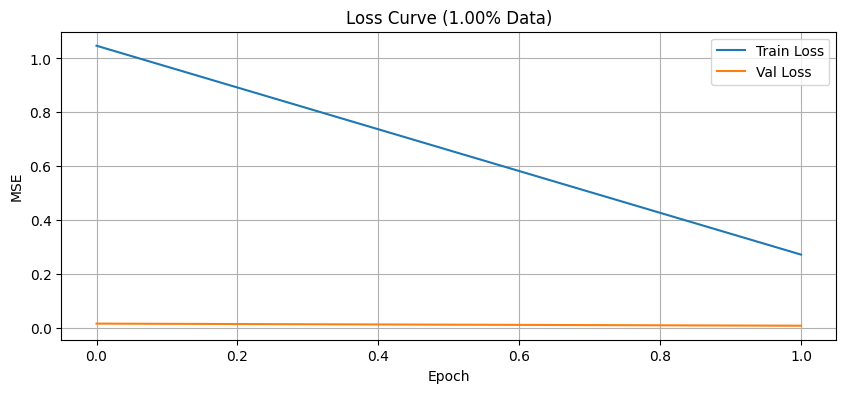

Loss curve saved to: plots/loss_curve_gru_btc_1pct.png
Generating predictions on test set...
393/393 [==============================] - 1s 1ms/step
Predictions shape: (12561, 1)
Plotting predictions and saving comparison CSV...
Prediction plot saved to: plots/prediction_plot_gru_btc_1pct.png


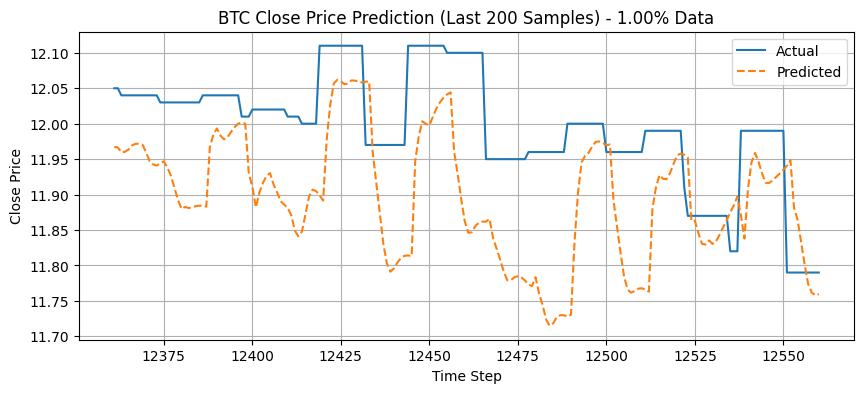

Comparison CSV saved to: data/result-data/gru_btc_comparison_1pct.csv
Printing evaluation metrics...
Accuracy:  0.4721
Precision: 0.0630
Recall:    0.5343
F1-Score:  0.1127
Metrics for 1.000% dataset:
MSE:  0.0075
RMSE: 0.0864
MAE:  0.0642
Saving model and scaler...
Model saved to: models/gru_btc_model_1pct.h5
Scaler saved to: models/gru_btc_scaler_1pct.pkl
Training and prediction complete.
Signal distribution:
-1    9459
 1    3102
Name: Signal, dtype: int64
Setting up Backtest object...
Running backtest engine...
Found 3102 +1 signals and 9459 -1 signals in the data.


Backtest.run:   0%|          | 0/12560 [00:00<?, ?bar/s]

Start                                 50273.0
End                                   62833.0
Duration                              12560.0
Exposure Time [%]                    81.61771
Equity Final [$]                1328556.78322
Equity Peak [$]                 1328556.78322
Return [%]                         1228.55678
Buy & Hold Return [%]                  9.3692
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]                     NaN
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              0.0
Alpha [%]                          1226.02973
Beta                                  0.26972
Max. Drawdown [%]                    -9.97245
Avg. Drawdown [%]                    -1.14394
Max. Drawdown Duration                  429.0
Avg. Drawdown Duration               59.11446
# Trades                               1077.0
Win Rate [%]                         49.11792
Best Trade [%]                    

In [79]:
stats_btc_gru = run_full_pipeline(
    asset="btc", 
    model_name = "gru",
    epochs=EPOCHS,
    model_function=build_gru_model, 
    data_percent=DATA_PERCENTAGE,
    stop_loss_pct= STOP_LOSS
)

In [ ]:
stats_btc_gru = run_full_pipeline(
    asset="eth", 
    model_name = "gru",
    epochs=EPOCHS,
    model_function=build_gru_model, 
    data_percent=DATA_PERCENTAGE,
    stop_loss_pct= STOP_LOSS
)

## CNN

In [ ]:
def build_cnn_model(input_shape):
    model = Sequential()
    model.add(Conv1D(filters=32, kernel_size=3, activation='relu', input_shape=input_shape))
    model.add(MaxPooling1D(pool_size=2))
    model.add(Dropout(0.2))
    model.add(Flatten())
    model.add(Dense(64, activation='relu'))
    model.add(Dense(1, activation='linear'))
    model.compile(loss='mse', optimizer=Adam(learning_rate=0.001))
    return model

In [ ]:
stats_btc_gru = run_full_pipeline(
    asset="btc", 
    model_name = "cnn",
    epochs=EPOCHS,
    model_function=build_cnn_model, 
    data_percent=DATA_PERCENTAGE,
    stop_loss_pct= STOP_LOSS
)

In [ ]:
stats_btc_gru = run_full_pipeline(
    asset="eth", 
    model_name = "cnn",
    epochs=EPOCHS,
    model_function=build_cnn_model, 
    data_percent=DATA_PERCENTAGE,
    stop_loss_pct= STOP_LOSS
)

## Transformer

In [ ]:
def build_transformer_model(input_shape):
    print("Building Transformer model with input shape:", input_shape)
    input_layer = Input(shape=input_shape)
    attention = MultiHeadAttention(num_heads=2, key_dim=input_shape[-1])(input_layer, input_layer)
    attention = Dropout(0.2)(attention)
    attention = LayerNormalization(epsilon=1e-6)(attention + input_layer)
    pooled = GlobalAveragePooling1D()(attention)
    dense = Dense(64, activation='relu')(pooled)
    output = Dense(1, activation='linear')(dense)
    model = Model(inputs=input_layer, outputs=output)
    model.compile(loss='mse', optimizer=Adam(learning_rate=0.001))
    return model

In [ ]:
stats_btc_gru = run_full_pipeline(
    asset="btc", 
    model_name = "transformer",
    epochs=EPOCHS,
    model_function=build_transformer_model, 
    data_percent=DATA_PERCENTAGE,
    stop_loss_pct= STOP_LOSS
)

In [ ]:
stats_btc_gru = run_full_pipeline(
    asset="eth", 
    model_name = "transformer",
    epochs=EPOCHS,
    model_function=build_transformer_model, 
    data_percent=DATA_PERCENTAGE,
    stop_loss_pct= STOP_LOSS
)

## RNN

In [ ]:
def build_rnn_model(input_shape):
    print("Building RNN model with input shape:", input_shape)
    model = Sequential()
    model.add(SimpleRNN(64, activation='tanh', input_shape=input_shape))
    model.add(Dropout(0.2))
    model.add(Dense(1, activation='linear'))
    model.compile(loss='mse', optimizer=Adam(learning_rate=0.001))
    return model

In [ ]:
stats_btc_gru = run_full_pipeline(
    asset="btc", 
    model_name = build_rnn_model,
    epochs=EPOCHS,
    model_function=build_rnn_model, 
    data_percent=DATA_PERCENTAGE,
    stop_loss_pct= STOP_LOSS
)

In [ ]:
stats_btc_gru = run_full_pipeline(
    asset="eth", 
    model_name = "build_rnn_model",
    epochs=EPOCHS,
    model_function=build_rnn_model, 
    data_percent=DATA_PERCENTAGE,
    stop_loss_pct= STOP_LOSS
)

## News

In [55]:
news_output_file = os.path.join(PROCESSED_DATA, "aggregated_news_with_features.csv.gz")
agg_news_features_df = pd.read_csv(news_output_file, compression="gzip", index_col="id")

In [56]:
agg_news_features_df

,hour,minute_of_hour,weekday,article_count,sentiment_score_mean,sentiment_score_median,sentiment_label_sum,sentiment_label_mode,char_count_mean,char_count_median,word_count_mean,word_count_median,rolling_sentiment_mean,daily_article_count,daily_sent_label_sum,daily_sent_score_mean,sentiment_label_mode_num
id,,,,,,,,,,,,,,,,,
201201011004,10,4,6,1,0.857624,0.857624,0.0,neutral,44.000000,44.0,7.000000,7.0,0.857624,146,0.0,0.816877,0.0
201201011009,10,9,6,1,0.609934,0.609934,0.0,negative,53.000000,53.0,8.000000,8.0,0.733779,146,0.0,0.816877,1.0
201201011024,10,24,6,1,0.798272,0.798272,0.0,negative,47.000000,47.0,7.000000,7.0,0.755277,146,0.0,0.816877,1.0
201201011030,10,30,6,1,0.932276,0.932276,0.0,neutral,27.000000,27.0,5.000000,5.0,0.780161,146,0.0,0.816877,0.0
201201011034,10,34,6,1,0.755185,0.755185,0.0,neutral,33.000000,33.0,6.000000,6.0,0.828578,146,0.0,0.816877,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
202312162352,23,52,5,8,0.000000,0.000000,0.0,0,49.625000,45.0,8.750000,9.5,0.000000,18796,0.0,0.000000,NaN
202312162353,23,53,5,2,0.000000,0.000000,0.0,0,58.000000,58.0,9.500000,9.5,0.000000,18796,0.0,0.000000,NaN
202312162354,23,54,5,3,0.000000,0.000000,0.0,0,56.666667,63.0,9.333333,10.0,0.000000,18796,0.0,0.000000,NaN


In [57]:
btc_df_features

,Open,High,Low,Close,Volume,minute_id,Close_1m_ago,PctChange_1m,Close_5m_ago,PctChange_5m,...,candle_range,body_size,Doji,ATR,+DI,-DI,ADX,%K,%D,Williams_%R
0,5.7,5.7,5.7,5.7,0.000000,201201311045,5.7,0.000000,5.58,0.021505,...,0.0,0.0,1,0.007391,100.000000,1.981151e-31,99.999517,100.000000,100.000000,-0.000000
1,5.7,5.7,5.7,5.7,0.000000,201201311046,5.7,0.000000,5.58,0.021505,...,0.0,0.0,1,0.006863,100.000000,1.981151e-31,99.999552,100.000000,100.000000,-0.000000
2,5.7,5.7,5.7,5.7,0.000000,201201311047,5.7,0.000000,5.58,0.021505,...,0.0,0.0,1,0.006373,100.000000,1.981151e-31,99.999584,100.000000,100.000000,-0.000000
3,5.7,5.7,5.7,5.7,0.000000,201201311048,5.7,0.000000,5.70,0.000000,...,0.0,0.0,1,0.005917,100.000000,1.981151e-31,99.999614,100.000000,100.000000,-0.000000
4,5.7,5.7,5.7,5.7,0.000000,201201311049,5.7,0.000000,5.70,0.000000,...,0.0,0.0,1,0.005495,100.000000,1.981151e-31,99.999641,100.000000,100.000000,-0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6283458,86156.0,86156.0,86134.0,86141.0,0.005310,202503082356,86148.0,-0.000081,86124.00,0.000197,...,22.0,15.0,0,29.457488,40.180010,3.405425e+01,15.976939,73.188406,73.188406,-26.811594
6283459,86159.0,86168.0,86149.0,86149.0,0.005360,202503082357,86141.0,0.000093,86178.00,-0.000337,...,19.0,10.0,0,29.281953,40.460875,3.181137e+01,15.690583,78.985507,76.811594,-21.014493
6283460,86137.0,86153.0,86117.0,86153.0,0.378927,202503082358,86149.0,0.000046,86143.00,0.000116,...,36.0,16.0,0,29.761814,36.965045,3.674288e+01,14.591356,81.884058,78.019324,-18.115942
6283461,86192.0,86192.0,86192.0,86192.0,0.000193,202503082359,86153.0,0.000453,86134.00,0.000673,...,0.0,0.0,1,30.421684,42.737157,3.337833e+01,14.427371,100.000000,86.956522,-0.000000


In [37]:
agg_news_features_df

,id,Date_dt,sentiment_sum,sentiment_mean,title_length_sum,title_length_mean,word_count_sum,word_count_mean,news_count,hour_get_mode,day_of_week_get_mode
0,201201011004,2012-01-01 10:04:00+00:00,0,0.000000,44,44.000000,7,7.000000,1,10,6
1,201201011009,2012-01-01 10:09:00+00:00,-1,-1.000000,53,53.000000,8,8.000000,1,10,6
2,201201011024,2012-01-01 10:24:00+00:00,-1,-1.000000,47,47.000000,7,7.000000,1,10,6
3,201201011030,2012-01-01 10:30:00+00:00,0,0.000000,27,27.000000,5,5.000000,1,10,6
4,201201011034,2012-01-01 10:34:00+00:00,0,0.000000,33,33.000000,6,6.000000,1,10,6
...,...,...,...,...,...,...,...,...,...,...,...
1361552,202312162352,2023-12-16 23:52:00+00:00,-1,-0.125000,397,49.625000,70,8.750000,8,23,5
1361553,202312162353,2023-12-16 23:53:00+00:00,0,0.000000,116,58.000000,19,9.500000,2,23,5
1361554,202312162354,2023-12-16 23:54:00+00:00,0,0.000000,170,56.666667,28,9.333333,3,23,5
1361555,202312162355,2023-12-16 23:55:00+00:00,-1,-0.333333,152,50.666667,23,7.666667,3,23,5
